<a href="https://colab.research.google.com/github/antskos/ds_diplom/blob/main/Diplom_DS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Модель прогнозирования стоимости жилья для агентства недвижимости.

***Цель работы -- разработать модель, которая позволила бы агентству недвижимости обойти конкурентов по скорости и качеству совершения сделок.***

#### Получение исходных данных:

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
!cp /content/gdrive/MyDrive/Colab\ Notebooks/diplom_data/data.zip .

In [ ]:
!unzip data.zip

Archive:  data.zip
  inflating: data.csv                


### Описание данных

Имеются данные состоящие из 18 столбцов и более чем 350000 строк.
Данны следующие признаки:
1. 'status' — статус продажи;
1. 'private pool' и 'PrivatePool' — наличие собственного бассейна;
1. 'propertyType' — тип объекта недвижимости;
1. 'street' — адрес объекта;
1. 'baths' — количество ванных комнат;
1. 'homeFacts' — сведения о строительстве объекта (содержит несколько
типов сведений, влияющих на оценку объекта);
1. 'fireplace' — наличие камина;
1. 'city' — город;
1. 'schools' — сведения о школах в районе;
1. 'sqft' — площадь в футах;
1. 'zipcode' — почтовый индекс;
1. 'beds' — количество спален;
1. 'state' — штат;
1. 'stories' — количество этажей;
1. 'mls-id' и 'MlsId' — идентификатор MLS (Multiple Listing Service, система
мультилистинга);
1. 'target' — цена объекта недвижимости (целевой признак, который
необходимо спрогнозировать)

### Обзор данных.

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
data = pd.read_csv('data.csv')
df = data.copy()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377185 entries, 0 to 377184
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   status        337267 non-null  object
 1   private pool  4181 non-null    object
 2   propertyType  342452 non-null  object
 3   street        377183 non-null  object
 4   baths         270847 non-null  object
 5   homeFacts     377185 non-null  object
 6   fireplace     103115 non-null  object
 7   city          377151 non-null  object
 8   schools       377185 non-null  object
 9   sqft          336608 non-null  object
 10  zipcode       377185 non-null  object
 11  beds          285903 non-null  object
 12  state         377185 non-null  object
 13  stories       226470 non-null  object
 14  mls-id        24942 non-null   object
 15  PrivatePool   40311 non-null   object
 16  MlsId         310305 non-null  object
 17  target        374704 non-null  object
dtypes: object(18)
memory usa

In [ ]:
print(f'Размер данных: {df.shape}')
df.head()

Размер данных: (377185, 18)


,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
0,Active,NaN,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,NaN,NaN,611019,"$418,000"
1,for sale,NaN,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,2.0,NaN,NaN,201916904,"$310,000"
2,for sale,NaN,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,1.0,NaN,yes,FR19221027,"$2,895,000"
3,for sale,NaN,single-family home,4311 Livingston Ave,8 Baths,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",yes,Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...","6,457 sqft",75205,5 Beds,TX,3.0,NaN,NaN,14191809,"$2,395,000"
4,for sale,NaN,lot/land,1524 Kiscoe St,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Palm Bay,"[{'rating': ['4/10', '5/10', '5/10'], 'data': ...",NaN,32908,NaN,FL,NaN,NaN,NaN,861745,"$5,000"


### Подготовка данных.

#### Объединение колонок.<br/>

Перед этапом проверки на наличие полных дубликатов, надо совместить признаки разнесённые по двум колонкам.

Видно что признак 'private pool' и признак 'PrivatePool' описывают одну характеристику -- наличие собственного бассейна. Точно также признак MlsId и mls_id также назначены для единственого параметра: идентификатора MLS.
Каждая из пар может быть совмещена в один признак, что позволит сократить количество колонок до 16 (считая с целевым).

Возможные сложности могут быть в случае, если в обоих строках присутствуют данные, но они разнятся между собой, проверю есть ли такие строки прежде всего.

**Объединение '*private_pool*' и  '*PrivatePool*'.**

In [ ]:
print(f"Разнообразие значений private_pool: {df['private pool'].unique()}")
print(f"Разнообразие значений PrivatePool: {df['PrivatePool'].unique()}")

Разнообразие значений private_pool: [nan 'Yes']
Разнообразие значений PrivatePool: [nan 'yes' 'Yes']


In [ ]:
df[(~df['private pool'].isna()) & (~df['PrivatePool'].isna())].head()

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target


Видно, что пересечений в данных нет, поэтому можно совместить колонки в одну. Заодно сразу приведу в бинарный вид.

In [ ]:
print(f"Количество заполненных значений в private_pool: {(~df['private pool'].isna()).sum()}")
print(f"Количество заполненных значений в PrivatePool: {(~df['PrivatePool'].isna()).sum()}")

Количество заполненных значений в private_pool: 4181
Количество заполненных значений в PrivatePool: 40311


После совмещения можно проверить сумму из заполненных колонок, должна получиться сумма равная 44492 значениям. Алгоритм такой: заполнить нулями пропуски, заменить 'yes' на единицы, сложить в новую колонку результат, удалить старые колонки.

In [ ]:
df['private pool'].fillna(value=0, inplace=True)
df['private pool'] = df['private pool'].map(lambda x: 1 if x=='Yes' else 0)
df['private pool'] = df['private pool'].astype(np.uint8)

df['PrivatePool'].fillna(value=0, inplace=True)
df['PrivatePool'] = df['PrivatePool'].map(lambda x: 1 if x=='yes' or x=='Yes' else 0)
df['PrivatePool'] = df['PrivatePool'].astype(np.uint8)

# так как у нас наименование остальных колонок в camelCase, сделаю также
df['privatePool'] = df['private pool'] + df['PrivatePool']
print(f"Cумма заполненных значений в объединённой колонке: {df['privatePool'].sum()}")
print(f"Cумма сходится с контрольной суммой?: {44492 == df['privatePool'].sum()}")

df.drop(['private pool', 'PrivatePool'], axis=1, inplace=True)

Cумма заполненных значений в объединённой колонке: 44492
Cумма сходится с контрольной суммой?: True


**Объединение '*mls-id*' и  '*MlsId*'.**

In [ ]:
print(f"Количество разнообразных значений mls-id: {df['mls-id'].nunique()}")
print(f"Количество разнообразных значений MlsId: {df['MlsId'].nunique()}")
print(f"Суммарное количество значений mls-id: {df[df['mls-id'] != '']['mls-id'].count()}")
print(f"Суммарное количество значений MlsId: {df[df['MlsId'] != '']['MlsId'].count()}")
df[df['MlsId'] != '']['MlsId'].count()

Количество разнообразных значений mls-id: 24907
Количество разнообразных значений MlsId: 232944
Суммарное количество значений mls-id: 24942
Суммарное количество значений MlsId: 310305


310305

In [ ]:
df[(~df['mls-id'].isna()) & (~df['MlsId'].isna())].head()

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,MlsId,target,privatePool


Общих индексов в данных нет, поэтому можно совместить колонки в одну без возникновения конфликтов.
После совмещения должна получиться сумма заполненных информацией ячеек 335247.

In [ ]:
df['mls-id'].fillna(value='', inplace=True)
df['MlsId'].fillna(value='', inplace=True)

df['mlsId'] = df['mls-id'] + df['MlsId']
print(f"Cумма заполненных значений в объединённой колонке: {df[df['mlsId'] != '']['mlsId'].count()}")
print(f"Cумма сходится с контрольной суммой?: {335247 == df[df['mlsId'] != '']['mlsId'].count()}")

df.drop(['mls-id', 'MlsId'], axis=1, inplace=True)

Cумма заполненных значений в объединённой колонке: 335247
Cумма сходится с контрольной суммой?: True


#### Удаление дубликатов.<br/>

Можно проверить на дубликаты до заполнения пустых значений, так как np.nan при проверке в одних колонках сравниваются как равные методом duplicated().

In [ ]:
# проверка на дубликаты
len(df)- len(df.drop_duplicates())

50

In [ ]:
df = df.drop_duplicates()
df.shape

(377135, 16)

In [ ]:
df.head()

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,target,privatePool,mlsId
0,Active,Single Family Home,240 Heather Ln,3.5,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",Gas Logs,Southern Pines,"[{'rating': ['4', '4', '7', 'NR', '4', '7', 'N...",2900,28387,4,NC,NaN,"$418,000",0,611019
1,for sale,single-family home,12911 E Heroy Ave,3 Baths,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Spokane Valley,"[{'rating': ['4/10', 'None/10', '4/10'], 'data...","1,947 sqft",99216,3 Beds,WA,2.0,"$310,000",0,201916904
2,for sale,single-family home,2005 Westridge Rd,2 Baths,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",yes,Los Angeles,"[{'rating': ['8/10', '4/10', '8/10'], 'data': ...","3,000 sqft",90049,3 Beds,CA,1.0,"$2,895,000",1,FR19221027
3,for sale,single-family home,4311 Livingston Ave,8 Baths,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",yes,Dallas,"[{'rating': ['9/10', '9/10', '10/10', '9/10'],...","6,457 sqft",75205,5 Beds,TX,3.0,"$2,395,000",0,14191809
4,for sale,lot/land,1524 Kiscoe St,NaN,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,Palm Bay,"[{'rating': ['4/10', '5/10', '5/10'], 'data': ...",NaN,32908,NaN,FL,NaN,"$5,000",0,861745


#### Упрощение модели.

**Для подгоготовки первой модели машинного обучения исходный набор признаков, будет сокращён. Такое решение является вынужденным, в связи с ограниченностью времени, но подходит под концепцию иттеративно-эволюционного подхода.**

На данном этапе принято решение убрать из рассмотрения следующие столбцы:'propertyType', 'street', 'baths', 'zipcode', 'fireplace', 'city', 'schools', 'beds', 'state', 'stories', 'mlsId'.

Таким образом останутся столбцы: 'status', 'homeFacts', 'sqft', 'privatePool' и 'target'.

In [ ]:
data = df.copy()

df = df[['status', 'homeFacts', 'sqft', 'privatePool', 'target']]
df.head()

,status,homeFacts,sqft,privatePool,target
0,Active,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",2900,0,"$418,000"
1,for sale,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...","1,947 sqft",0,"$310,000"
2,for sale,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...","3,000 sqft",1,"$2,895,000"
3,for sale,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...","6,457 sqft",0,"$2,395,000"
4,for sale,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,0,"$5,000"


#### Обработка колонки 'status'.<br/>

Извлеку самые частые значения из колонки:

In [ ]:
df['status'].value_counts()[:20]

for sale                     156058
Active                       105207
For sale                      43464
foreclosure                    6425
New construction               5474
Pending                        4702
Pre-foreclosure                2119
Pre-foreclosure / auction      1560
P                              1488
Under Contract Show            1183
 / auction                      936
Under Contract   Showing        793
Active Under Contract           718
New                             690
Under Contract                  690
Contingent                      581
Price Change                    563
Auction                         536
Foreclosed                      459
A Active                        443
Name: status, dtype: int64

Видно, что самые частые статусы: 'for sale' и 'active'. Пропуски в данных будут заполнены сатусом 'for sale'.

In [ ]:
import string

df['status'].fillna(value='for sale', inplace=True)
df['status'] = df['status'].str.lower()

# уборка знаков пунктуации в тексте
replace_punctuation = str.maketrans('', '', string.punctuation)
df['status'] = df['status'].str.translate(replace_punctuation)

Среди названий статусов, видны синонимы или сокращения обозначающие предположительно один и тот же вид статуса.
Сначала будет произведена замена сокращений на полные слова.
После чего статусы-синонимы будут названы, каким то одним из имён.
Затем из самых часто встречаемых слов, которые не обозначют непосредственно статус, но сопутсвуют ему, будут сформированы отдельные признаки.

In [ ]:
import re

# в кортеже ниже предполагаемые варианты расшифровки сокращений
# используемых в колонке status
# функция для замены по регуляркам
def replace_letters_with_words(text):
    repl = [
        (r'preforeclosure', 'pre-foreclosure'),
        (r'(^|\b)pf(\b|$)', 'pre-foreclosure'),
        (r'(^|\b)p(\b|$)', 'pending'),
        (r'(^|\b)a(\b|$)', 'auction'),
        (r'(^|\b)ab(\b|$)', 'active backup'),
        (r'(^|\b)c(\b|$)', 'contract'),
        (r'(^|\b)pi(\b|$)', 'pending inspection'),
        (r'^.*\bcoming soon\b.*$', 'coming soon'),
        (r'(^|\b)insp(\b|$)', 'inspection'),
        (r'(^|\b)uc(\b|$)', 'under contract'),
        (r'(^|\b)sh(\b|$)', 'show'),
        (r'w\s+bckp', 'wanted backup'),
        (r'(^|\b)ps(\b|$)', 'pending show'),
        (r'\bw\b', ''),
        (r'(^|\b)with(\b|$)', ''),
        (r'(^|\b)ct(\b|$)', 'contingency'),
        (r'(^|\b)(?<!(pre-|pre\s))foreclosure(\b|$)', 'foreclosed'),
        ('new construction', 'new'),
        ('\/', ' '),
        (r'^.*\bsold\b.*$', 'sold'),
        (r'^.*\brent\b.*$', 'rent'),
        (r'(^|\b)bckp(\b|$)', 'backup'),

    ]

    for pattern, value in repl:
        local = re.sub(pattern, value, text)
        if local != text:
            return local
    return text

In [ ]:
df['status'] = df['status'].map(replace_letters_with_words)

In [ ]:
# выравниевание строк статусов
df['status'] = df['status'].str.strip()

In [ ]:
# промежуточная проверка
df['status'].value_counts()[:20]

for sale                             239441
active                               105207
foreclosed                             7227
pending                                6295
new                                    6164
pre-foreclosure                        2123
pre-foreclosure  auction               1560
auction                                1472
under contract show                    1183
under contract   showing                793
active under contract                   718
under contract                          692
contingent                              581
price change                            563
auction active                          443
rent                                    412
sold                                    289
under contract backups                  252
contingent finance and inspection       245
pending continue to show                195
Name: status, dtype: int64

Как было написано выше, есть статусы состоящие из нескольких слов, например из слов pending и show.
Можно отделить признак **show**, возможно эта информация будет улучшать прогнозные оценки модели и сохранить только статус **pending** отдельно, так как такие статусы, есть и без show. Это можно увидеть, посмотрев на уникальные значения статусов.

In [ ]:
print(f"Разнообразие значений private_pool: {df['status'].unique()}")

Разнообразие значений private_pool: ['active' 'for sale' 'new' 'pending' 'activecontingent'
 'pre-foreclosure  auction' 'auction' 'under contract'
 'under contract   showing' 'pre-foreclosure' 'under contract backups'
 'foreclosed' 'active under contract' 'option pending'
 'under contract show' 'rent' 'auction active' 'contingent'
 'pending   continue to show' 'price change' 'back on market'
 'active option' 'sold' 'coming soon' 'contingent finance and inspection'
 'pending pending sale' 'active  contingencies' 'pending active backup'
 'contingent show' 'contract pending' 'contingent take backup'
 'backup contract' 'option contract' 'pending continue to show'
 'pending inspection' 'active option contract' 'contract'
 'auction  active' 'contingent   show' 'due diligence period'
 'contract contingent on buyer sale' 'u under contract'
 'active contingency' 'pending  contingencies' 'leasepurchase pending'
 'pending bring backup' 'contract continue show' 'pending taking backups'
 'offer pen

Группировка статусов обозначенных разными именами, но предположительно одинакового назначения.

In [ ]:
# функция создана для упрощения статуса, приводя несколько слов к одному
def replace_status_part(text, oblig_word, words_to_exclude):
    words = text.split()
    if oblig_word in words:
        for word in words:
            if word in words_to_exclude:
                text = text.replace(word, '')
    return text.strip()

# статусы относящиеся к аукционным продажам
auction_words = ['pre-foreclosure', 'active']
df['status'] = df['status'].map(lambda x: replace_status_part(x, 'auction', auction_words))
df['status'] = df['status'].str.replace('pre-foreclosure', 'auction')

# статусы относящиеся к заключённому контракту
contract_words = ['under', 'u', 'active']
df['status'] = df['status'].map(lambda x: replace_status_part(x, 'contract', contract_words))

# contingency
df['status'] = df['status'].str.replace('contingencies', 'contingency')

# no show
df['status'] = df['status'].str.replace('no show', '')
df['status'] = df['status'].str.replace('not show', '')

# статусы относящиеся к show
df['status'] = df['status'].str.replace('showing', 'show')


# статусы относящиеся к резервным предложениям
df['status'] = df['status'].map(lambda x: re.sub(r'[a-z]?back\s?up[a-z]?', 'backup', x))

backup_words = ['under', 'u', 'active', 'wanted', 'take', 'taking', 'offer', 'offers']
df['status'] = df['status'].map(lambda x: replace_status_part(x, 'backup', backup_words))

Из столбца статус будут извлечены дополнительные признаки, которые могут влиять на стоимость, но в целом их учёт будет зависеть от используемой модели так как строк в этих признаках будет немного.


In [ ]:
df['show'] = 0
df['backup'] = 0
df['contingent'] = 0

def word_to_bool(word, text):
  if word in text:
    return 1
  return 0

df['show'] = df['status'].map(lambda x: word_to_bool('show', x))
df['backup'] = df['status'].map(lambda x: word_to_bool('backup', x))
df['contingent'] = df['status'].map(lambda x: word_to_bool('contingent', x))

print(f"Количество True значений в признаке show: {df['show'].sum()}")
print(f"Количество True значений в признаке backup: {df['backup'].sum()}")
print(f"Количество True значений в признаке contingent: {df['contingent'].sum()}")

Количество True значений в признаке show: 2327
Количество True значений в признаке backup: 410
Количество True значений в признаке contingent: 1026


Видно, что значений в сформированных признаках мало, но пока оставлю эти признаки, чтобы не потерять информацию в данных.<br/>
Ниже будут выделены ключевые категории и убраны, зашумляющие значения в колонке status.

In [ ]:
# статусы относящиеся к for sale
df['status'] = df['status'].str.replace('back on market', 'for sale')

# статусы относящиеся к активным
df['status'] = df['status'].map(lambda x: re.sub(r'[a-z]?\s?activ?[a-z]?', 'active', x))


# статуса backup не будет, вместо него будет active
df['status'] = df['status'].str.replace('backup', 'active')

# статуса backup не будет, вместо него будет pending
df['status'] = df['status'].str.replace('contingent', 'pending')

def search_the_word(word, text):
  if word in text:
    return word
  return text

# все статусы, где  есть contingency будут относится к contingency
# так как их мало, они либо не сильно повлияют на итоговую оценку, либо дадут дополнительную ветку для деревьев
df['status'] = df['status'].map(lambda x: search_the_word('contingency', x))

# очищу остальные статусы от лишних слов
df['status'] = df['status'].map(lambda x: search_the_word('contract', x))
df['status'] = df['status'].map(lambda x: search_the_word('pending', x))
df['status'] = df['status'].map(lambda x: search_the_word('active', x))

Наиболее редкие статусы помещу в категорию other. Ограничу эту категорию довольно маленьким занчением, так как статус 'contingency', что может переводиться как --> непредвиденные обстоятельства, может повлиять на цену сильно. Эту гипотезу можно не проверять, так как таких значений очень мало.

In [ ]:
status_counts = df['status'].value_counts()[:20]
df['status'] = df['status'].map(lambda x: 'other' if status_counts[x] < 90 else x)

df['status'].value_counts()

for sale        239553
active          105310
pending           7847
foreclosed        7227
new               6164
auction           5636
contract          3852
price change       563
rent               412
sold               289
coming soon        110
contingency         94
other               78
Name: status, dtype: int64

В итоге осталось 13 статусов продажи недвижимости. Будет интересно проверить, как распределена цена в зависимости от статуса. Ниже будет представлена соответсвующая диаграмма.

#### Очистка целевого признака.<br/>

Перед преобразованием целевого признака в числовой вид, его требуется предобработать: очистить от нечисловых знаков, таких как '$' и ','; привести к числовому типу данных.

In [ ]:
print(f"Пропуски в целевом признаке: {df['target'].isna().sum()}")
df = df[df['target'].notna()]

Пропуски в целевом признаке: 2480


In [ ]:
# резервная копия
df_rez = df.copy()

Пропуски в целевом признаке есть. Их относительно немного.  Строки таблицы, которые их содержат были исключены из рассмотрения, так как будет обучаться модель с учителем.

In [ ]:
df.head(3)

,status,homeFacts,sqft,privatePool,target,show,backup,contingent
0,active,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",2900,0,"$418,000",0,0,0
1,for sale,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...","1,947 sqft",0,"$310,000",0,0,0
2,for sale,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...","3,000 sqft",1,"$2,895,000",0,0,0


Функция для вывода строк столбцов по длине. Возвращает pd.Series.

In [ ]:
def column_to_df_by_len(pdSeries):
    idx = pdSeries.str.len().sort_values(ascending=False).index
    df_ = pdSeries.reindex(idx)
    df_ = df_.reset_index(drop=True)
    return df_

In [ ]:
# вывод больших по длине строк с ценами: проверка на присутсвующие знаки
column_to_df_by_len(df['target'])

0         $1,215 - $1,437/mo
1               $11,495,000+
2               $150,000,000
3               $110,000,000
4               $165,000,000
                 ...        
374650                     3
374651                     1
374652                     3
374653                     8
374654                     1
Name: target, Length: 374655, dtype: object

Видно, что цена может содержать, знаки доллара и сложения, а также несколько запятых. Видна одна неформатная строка содержащая больше других символов, их можно поискать, а строку с диапазоном преобразовать отдельно.
Прелполагаю, что деление чисел меньше целых отсутствует. Исходя из этого будут проведены преобразования.  
Если какие-то знаки остатлись незамечеными, возникнет ошибка при конвертации типа и пользователь об этом узнает.
<br />
Присутствуют **особые случаи:**

In [ ]:
print('Строк содержащих дефис одна:')
display(df.loc[df['target'].str.contains('-'), 'target'])

Строк содержащих дефис одна:


330468    $1,215 - $1,437/mo
Name: target, dtype: object

Было замесчено, что строки содержащие /mo, присутсвуют только со статусом rent. Что будет показано ниже, поэтому дополнительное создание признака не понадобиться для этого случая.

In [ ]:
df[(df.status == 'rent') & (df['target'].str.contains('mo'))]['target'].unique()[:10]

array(['$5,500/mo', '$10,500/mo', '$6,390/mo', '$1,200/mo', '$3,600/mo',
       '$3,250/mo', '$1,400/mo', '$4,999/mo', '$1,250/mo', '$2,900/mo'],
      dtype=object)

In [ ]:
df[(df.status != 'rent') & (df['target'].str.contains('mo'))]['target'].unique()[:10]

array([], dtype=object)

In [ ]:
# строка содержащая дефис
df.loc[df['target'].str.contains('-'), 'target'] = '1300'
df['target'] = df['target'].str.replace('/mo', '', regex=False)
df['target'] = df['target'].str.replace('+', '', regex=False)
df['target'] = df['target'].str.replace('$', '', regex=False)
df['target'] = df['target'].str.replace(',', '', regex=False)
df['target'] = df['target'].astype('int32')
df['target'].head()

0     418000
1     310000
2    2895000
3    2395000
4       5000
Name: target, dtype: int32

Целевой признак был приведён к числовому виду.

#### Извлечение информации из словаря homeFacts.

In [ ]:
df.head()

,status,homeFacts,sqft,privatePool,target,show,backup,contingent
0,active,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",2900,0,418000,0,0,0
1,for sale,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...","1,947 sqft",0,310000,0,0,0
2,for sale,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...","3,000 sqft",1,2895000,0,0,0
3,for sale,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...","6,457 sqft",0,2395000,0,0,0
4,for sale,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,0,5000,0,0,0


Обработка признака homeFacts.

In [ ]:
# сброс индекса, так как из-за этого не вставляются столбцы правильно(предположительно)
df = df.reset_index(drop=True)

In [ ]:
import json
import ast

In [ ]:
# извлечение словаря из списка homeFacts
df['dict1'] = df['homeFacts'].map(lambda x: ast.literal_eval(x))

In [ ]:
df['dict1'][0]

{'atAGlanceFacts': [{'factValue': '2019', 'factLabel': 'Year built'},
  {'factValue': '', 'factLabel': 'Remodeled year'},
  {'factValue': 'Central A/C, Heat Pump', 'factLabel': 'Heating'},
  {'factValue': '', 'factLabel': 'Cooling'},
  {'factValue': '', 'factLabel': 'Parking'},
  {'factValue': None, 'factLabel': 'lotsize'},
  {'factValue': '$144', 'factLabel': 'Price/sqft'}]}

In [ ]:
# в словаре хранится только один ключ, со значением по ключу в виде списка словарей
# словари будут извлечены из списка и распределены в отдельные таблицы
df_hf = pd.json_normalize(df['dict1'])
df_hf_L1 = pd.json_normalize(df_hf['atAGlanceFacts'])

In [ ]:
df_hf_L1.head(5)

,0,1,2,3,4,5,6
0,"{'factValue': '2019', 'factLabel': 'Year built'}","{'factValue': '', 'factLabel': 'Remodeled year'}","{'factValue': 'Central A/C, Heat Pump', 'factL...","{'factValue': '', 'factLabel': 'Cooling'}","{'factValue': '', 'factLabel': 'Parking'}","{'factValue': None, 'factLabel': 'lotsize'}","{'factValue': '$144', 'factLabel': 'Price/sqft'}"
1,"{'factValue': '2019', 'factLabel': 'Year built'}","{'factValue': '', 'factLabel': 'Remodeled year'}","{'factValue': '', 'factLabel': 'Heating'}","{'factValue': '', 'factLabel': 'Cooling'}","{'factValue': '', 'factLabel': 'Parking'}","{'factValue': '5828 sqft', 'factLabel': 'lotsi...","{'factValue': '$159/sqft', 'factLabel': 'Price..."
2,"{'factValue': '1961', 'factLabel': 'Year built'}","{'factValue': '1967', 'factLabel': 'Remodeled ...","{'factValue': 'Forced Air', 'factLabel': 'Heat...","{'factValue': 'Central', 'factLabel': 'Cooling'}","{'factValue': 'Attached Garage', 'factLabel': ...","{'factValue': '8,626 sqft', 'factLabel': 'lots...","{'factValue': '$965/sqft', 'factLabel': 'Price..."
3,"{'factValue': '2006', 'factLabel': 'Year built'}","{'factValue': '2006', 'factLabel': 'Remodeled ...","{'factValue': 'Forced Air', 'factLabel': 'Heat...","{'factValue': 'Central', 'factLabel': 'Cooling'}","{'factValue': 'Detached Garage', 'factLabel': ...","{'factValue': '8,220 sqft', 'factLabel': 'lots...","{'factValue': '$371/sqft', 'factLabel': 'Price..."
4,"{'factValue': '', 'factLabel': 'Year built'}","{'factValue': '', 'factLabel': 'Remodeled year'}","{'factValue': '', 'factLabel': 'Heating'}","{'factValue': '', 'factLabel': 'Cooling'}","{'factValue': '', 'factLabel': 'Parking'}","{'factValue': '10,019 sqft', 'factLabel': 'lot...","{'factValue': None, 'factLabel': 'Price/sqft'}"


После операций преобразования получили данные из колонки homeFacts в табличном виде. Таблица также содержит значения словарей. В ней словари расположены по колонкам, а ячейки словарей по строкам. Данные каждого словаря таблицы будут извлечены в новые датафреймы,обработаны и добавлены в исходный фрейм данных.

##### Данные о годе постройки зданий.

In [ ]:
df_hf_L2_0 = pd.json_normalize(df_hf_L1[0])

In [ ]:
df_hf_L2_0 = df_hf_L2_0.rename({'factValue': 'yearBuilt'}, axis='columns')
df_hf_L2_0 = df_hf_L2_0.drop(['factLabel'], axis=1)

# добавляю колонку в исходную таблицу
df['yearBuilt'] = df_hf_L2_0['yearBuilt']

df_hf_L2_0['yearBuilt'].head(5)

0    2019
1    2019
2    1961
3    2006
4        
Name: yearBuilt, dtype: object

##### Данные о годе реновации зданий.

In [ ]:
df_hf_L2_1 = pd.json_normalize(df_hf_L1[1])

In [ ]:
df_hf_L2_1 = df_hf_L2_1.rename({'factValue': 'yearRemodeled'}, axis='columns')
df_hf_L2_1 = df_hf_L2_1.drop(['factLabel'], axis=1)
# добавляю колонку в исходную таблицу
df['yearRemodeled'] = df_hf_L2_1['yearRemodeled']

df_hf_L2_1.head(5)

,yearRemodeled
0,
1,
2,1967
3,2006
4,


##### Данные о системах отопления зданий.

In [ ]:
df_hf_L2_2 = pd.json_normalize(df_hf_L1[2])

In [ ]:
df_hf_L2_2 = df_hf_L2_2.rename({'factValue': 'Heating'}, axis='columns')
df_hf_L2_2 = df_hf_L2_2.drop(['factLabel'], axis=1)
# # добавляю колонку в исходную таблицу
# df['Heating'] = df_hf_L2_2['Heating']

df_hf_L2_2.head(5)

,Heating
0,"Central A/C, Heat Pump"
1,
2,Forced Air
3,Forced Air
4,


In [ ]:
df_hf_L2_2['Heating'].unique()

array(['Central A/C, Heat Pump', '', 'Forced Air', ...,
       'Electric Furnace, Electric Heat Pump',
       'Floor Furnace, Wall Electric, Wall Gas',
       'Baseboard, Hot Water, Programmable Thermostat, Radiant Floor'],
      dtype=object)

Очень много уникальных значений, на этом этапе не  буду использовать этот признак с данными об  отоплении.

##### Данные о системах охлаждения зданий.

In [ ]:
df_hf_L2_3 = pd.json_normalize(df_hf_L1[3])

In [ ]:
df_hf_L2_3 = df_hf_L2_3.rename({'factValue': 'Cooling'}, axis='columns')
df_hf_L2_3 = df_hf_L2_3.drop(['factLabel'], axis=1)
# # добавляю колонку в исходную таблицу
# df['Cooling'] = df_hf_L2_3['Cooling']

df_hf_L2_3.head(5)

,Cooling
0,
1,
2,Central
3,Central
4,


In [ ]:
df_hf_L2_3['Cooling'].unique()

array(['', 'Central', 'Central Air', ...,
       'Central Air, Electric Hot Air, Gas (Hot Air), Heat Pump for A/C, Heat Pump for Heat, Multi-Zone A/C, Multi-Zone Heat, Natural Gas',
       '90%+ High Efficiency, Ductless HP-Mini Split, Tankless Water Heater',
       'Central A/C (Gas), Central Heat (Gas), Heat Pump'], dtype=object)

При просмотре на столбцы Cooling и Heating становится понятно, что они скорее всего пересекаются. И в исходные данные надо было бы добавлять общие признаки на их основе.

##### Данные о наличии парковочных мест при строениях.

In [ ]:
df_hf_L2_4 = pd.json_normalize(df_hf_L1[4])

In [ ]:
df_hf_L2_4 = df_hf_L2_4.rename({'factValue': 'Parking'}, axis='columns')
df_hf_L2_4 = df_hf_L2_4.drop(['factLabel'], axis=1)
# # добавляю колонку в исходную таблицу
# df['Parking'] = df_hf_L2_4['Parking']

df_hf_L2_4.head(5)

,Parking
0,
1,
2,Attached Garage
3,Detached Garage
4,


In [ ]:
df_hf_L2_4['Parking'].unique()

array(['', 'Attached Garage', 'Detached Garage', ...,
       'Basement, Detached',
       'Paved Driveway, Off Street, Detached Garage',
       'Deed Restrictions, Fitness, Gated Community, Golf Carts OK, No Truck/RV/Motorcycle Parking, Pool, Special Community Restrictions'],
      dtype=object)

Данные о парковке являются важной информацией, но на данном этапе не будут применяться для создания моделей МО.

##### Данные  о размере участка(лот), на котором расположен объект недвижимости.

In [ ]:
df_hf_L2_5 = pd.json_normalize(df_hf_L1[5])

In [ ]:
df_hf_L2_5 = df_hf_L2_5.rename({'factValue': 'lotsize'}, axis='columns')
df_hf_L2_5 = df_hf_L2_5.drop(['factLabel'], axis=1)

df_hf_L2_5.head(5)

,lotsize
0,None
1,5828 sqft
2,"8,626 sqft"
3,"8,220 sqft"
4,"10,019 sqft"


In [ ]:
# вывод больших цен проверка на присутсвующие знаки
column_to_df_by_len(df_hf_L2_5['lotsize']).head(10)

0    24,001.56 acres lot
1     15,681.6 acres lot
2       17,463 acres lot
3       123.78 acres lot
4       200.61 acres lot
5       134.87 acres lot
6       117.26 acres lot
7       117.26 acres lot
8       117.26 acres lot
9       152.74 acres lot
Name: lotsize, dtype: object

Видно, что помимо 'sqft', есть ещё и акры. 1 акр равняется 43560 квадратных фута. Будет использован следующий алгоритм: в строках в местах, где будут найдены акры, в новый признак будет добавлен коэффициент перевода, это учтёт разницу в единицах измерения. Также в другой новый признак отдельно будет вынесена площадь лота участка.

In [ ]:
ACR_TO_FEET = 43560

# функция для расознавания акров по регуляркам
def find_acres(text):

    names = [
        r'(\b)?acre?s?(\b)?',
        r'(\b)?Acre?s?(\b)?',
        r'(\b)?ACRE?S?(\b)?',
    ]

    for pattern in names:
        local = re.search(pattern, text)
        if local is not None:
            return ACR_TO_FEET
        return 1

# функция для поиска цифр в колонке данных
def find_price(text):
    local = re.search(r'\d+\.?(\d+)?', text)
    if local is not None:
        return float(local[0])
    return -1

In [ ]:
df_hf_L2_5['lotsize'].replace('None', '_', inplace=True)
df_hf_L2_5['lotsize'] = df_hf_L2_5['lotsize'].str.replace(',', '', regex=False)
df_hf_L2_5['lotsize'] = df_hf_L2_5['lotsize'].fillna('_')

df_hf_L2_5['feet_koef'] = 1
df_hf_L2_5['sq_value'] = 0

df_hf_L2_5['feet_koef'] = df_hf_L2_5['lotsize'].map(find_acres)
df_hf_L2_5['sq_value'] = df_hf_L2_5['lotsize'].map(find_price)

In [ ]:
df_hf_L2_5.loc[20:25]

,lotsize,feet_koef,sq_value
20,1.18 acres,43560,1.18
21,15.32 acres lot,43560,15.32
22,—,1,-1.00
23,7962 sqft,1,7962.00
24,8120 sqft,1,8120.00
25,2080 sqft,1,2080.00


После успешного считывания информации надо создать столбец с ценой лота. А после этого заполнить все отрицательные цены средним значением положительных цен.

In [ ]:
df_hf_L2_5['lotSize'] = df_hf_L2_5['feet_koef'] * df_hf_L2_5['sq_value']
mean_pos_val = round(df_hf_L2_5[df_hf_L2_5['lotSize'] > 0]['lotSize'].mean(), 2)

print(f'\nПлощадь в квадратных футах для заполнения нулей составила:{mean_pos_val}\n')

df_hf_L2_5['lotSize'] = df_hf_L2_5['lotSize'].map(lambda x: mean_pos_val if x < 0 else x)

print(f"\nКоличество строк в признаке для передачи:{df_hf_L2_5['lotSize'].shape[0]}")


Площадь в квадратных футах для заполнения нулей составила:124918.39


Количество строк в признаке для передачи:374655


Таким образом ещё один признак подготовлен для добавления в основной dataframe.

In [ ]:
# добавляю колонку в исходную таблицу
df['lotSize'] = df_hf_L2_5['lotSize']

In [ ]:
df.head()

,status,homeFacts,sqft,privatePool,target,show,backup,contingent,dict1,yearBuilt,yearRemodeled,lotSize
0,active,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",2900,0,418000,0,0,0,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",2019,,124918.39
1,for sale,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...","1,947 sqft",0,310000,0,0,0,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",2019,,5828.00
2,for sale,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...","3,000 sqft",1,2895000,0,0,0,"{'atAGlanceFacts': [{'factValue': '1961', 'fac...",1961,1967,8626.00
3,for sale,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...","6,457 sqft",0,2395000,0,0,0,"{'atAGlanceFacts': [{'factValue': '2006', 'fac...",2006,2006,8220.00
4,for sale,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",NaN,0,5000,0,0,0,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",,,10019.00


По первой же строчке таблицы видно, что данные lotSize могут не совпадать непосредственно с площадью самой квартиры или покупаемого участка. Каким образом связаны эти две площади пока не ясно. Можно предположить, что площадь продаваемой недвижимости не может быть больше площади лота, и может быть расположена лишь на части площади лота. Сравнение на предмет того, что плозадь не выходит за размер лота будет проведено, но до получения первых результатов моделей, из этих колонок не будет извлекаться другая дополнительная информация.

##### Данные  об удельной стоимости жилья, т.е. цене на единицу площади.

In [ ]:
df_hf_L2_6 = pd.json_normalize(df_hf_L1[6])

In [ ]:
df_hf_L2_6 = df_hf_L2_6.rename({'factValue': 'unit_price_per_sqft'}, axis='columns')
df_hf_L2_6 = df_hf_L2_6.drop(['factLabel'], axis=1)
df_hf_L2_6.head(5)

,unit_price_per_sqft
0,$144
1,$159/sqft
2,$965/sqft
3,$371/sqft
4,None


In [ ]:
column_to_df_by_len(df_hf_L2_6['unit_price_per_sqft']).head(10)

0    $5000000 / Sq. Ft.
1    $1950000 / Sq. Ft.
2     $649900 / Sq. Ft.
3     $155000 / Sq. Ft.
4     $129900 / Sq. Ft.
5     $159900 / Sq. Ft.
6     $639900 / Sq. Ft.
7     $429000 / Sq. Ft.
8      $13304 / Sq. Ft.
9      $35000 / Sq. Ft.
Name: unit_price_per_sqft, dtype: object

In [ ]:
df_hf_L2_6['unit_price_per_sqft'].replace('None', '_', inplace=True)
df_hf_L2_6['unit_price_per_sqft'] = df_hf_L2_6['unit_price_per_sqft'].fillna('_')
print(f"Количество строк содержащих акры вместо футов в колонке: {df_hf_L2_6[df_hf_L2_6['unit_price_per_sqft'].str.contains('acr')].count()}")

Количество строк содержащих акры вместо футов в колонке: unit_price_per_sqft    0
dtype: int64


Если нигде не допущено ошибки, то в колонке удельной цены не используются акры, что позволяет просто вывести все найденные числа. И заполнить все ячейки не содержащие цифр минус единицей; после чего заполнить отрицательные значения средней ценой по выборке положительных чисел.

In [ ]:
df_hf_L2_6['unitPricePerSqFt'] = df_hf_L2_6['unit_price_per_sqft'].map(find_price)

mean_pos_val = round(df_hf_L2_6[df_hf_L2_6['unitPricePerSqFt'] > 0]['unitPricePerSqFt'].mean(), 2)
print(f'\nУдельная цена в квадратных футах для заполнения нулей составила:{mean_pos_val}\n')

df_hf_L2_6['unitPricePerSqFt'] = df_hf_L2_6['unitPricePerSqFt'].map(lambda x: mean_pos_val if x < 0 else x)
print(f"\nКоличество строк в признаке для передачи:{df_hf_L2_6['unitPricePerSqFt'].shape[0]}")


Удельная цена в квадратных футах для заполнения нулей составила:259.7


Количество строк в признаке для передачи:374655


In [ ]:
# добавление в исходную таблицу
df['unitPricePerSqFt'] = df_hf_L2_6['unitPricePerSqFt']

После добавления этой колонки, была добавлена вся желаемая информация из столбца homeFacts. Удалю его и словарь полученный из этого столбца из данных.

In [ ]:
df = df.drop(['homeFacts', 'dict1'], axis=1)
df.head()

,status,sqft,privatePool,target,show,backup,contingent,yearBuilt,yearRemodeled,lotSize,unitPricePerSqFt
0,active,2900,0,418000,0,0,0,2019,,124918.39,144.0
1,for sale,"1,947 sqft",0,310000,0,0,0,2019,,5828.00,159.0
2,for sale,"3,000 sqft",1,2895000,0,0,0,1961,1967,8626.00,965.0
3,for sale,"6,457 sqft",0,2395000,0,0,0,2006,2006,8220.00,371.0
4,for sale,NaN,0,5000,0,0,0,,,10019.00,259.7


##### Аналогично, столбцу lotSize будет преобразован столбец sqft.

In [ ]:
# вывод первых самых длинных строк столбца
column_to_df_by_len(df['sqft']).head(5)

0    Total interior livable area: 196,920 sqft
1    Total interior livable area: 357,000 sqft
2    Total interior livable area: 290,000 sqft
3    Total interior livable area: 158,600 sqft
4    Total interior livable area: 150,640 sqft
Name: sqft, dtype: object

В этом столбце надо заменить запятую на пустую строку и извлечь численное значение из строки.

In [ ]:
df['sqft'] = df['sqft'].str.replace(',', '')
df['sqft'] = df['sqft'].fillna('_')

df['sqft'] = df['sqft'].map(find_price)

mean_pos_val = round(df[df['sqft'] > 0]['sqft'].mean(), 2)
df['sqft'] = df['sqft'].map(lambda x: mean_pos_val if x < 0 else x)

#### Обработка столбцов yearBuilt, yearRemodeled.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374655 entries, 0 to 374654
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   status            374655 non-null  object 
 1   sqft              374655 non-null  float64
 2   privatePool       374655 non-null  uint8  
 3   target            374655 non-null  int32  
 4   show              374655 non-null  int64  
 5   backup            374655 non-null  int64  
 6   contingent        374655 non-null  int64  
 7   yearBuilt         371090 non-null  object 
 8   yearRemodeled     348316 non-null  object 
 9   lotSize           374655 non-null  float64
 10  unitPricePerSqFt  374655 non-null  float64
dtypes: float64(3), int32(1), int64(3), object(3), uint8(1)
memory usage: 27.5+ MB


##### Обработка столбца yearBuilt.

In [ ]:
df['yearBuilt'] = df['yearBuilt'].fillna('-1')

In [ ]:
df['yearBuilt'].unique()

array(['2019', '1961', '2006', '', '1920', '1976', '1970', '1965', '2015',
       '1996', '1982', '1905', '2008', '1899', '2016', '1954', '1989',
       '2014', '1915', '1994', '1910', '1923', '1960', '1977', '1972',
       '1963', '1981', '1949', '1930', '1991', '1958', '2005', '2017',
       '2018', '1983', '1928', '1998', '1997', '1964', '1974', '1940',
       '1973', '1968', '1999', '1918', '2007', '1984', '1946', '2003',
       '2000', '2004', '1969', '2002', '1952', '1947', '1957', '1978',
       '1956', '1967', '1975', '1988', '1955', '1950', '1959', '2012',
       '1924', '1966', '1992', '2001', '1995', '2010', '1971', '1909',
       '1953', '1993', '1990', '1980', '1985', '1951', '1907', '1885',
       '1941', '1927', '1929', '1901', '-1', '1922', '1906', '1945',
       '1979', '2009', '1962', '1913', '2011', '1897', '1987', '2020',
       '1926', '1939', '1925', '2013', '1986', 'No Data', '1943', '1935',
       '1890', '1895', '1911', '1948', '1942', '1916', '1900', '1931',
 

Функция replace() не срабатывала для пустой строки. Поэтому пустая строка была заменена по индексу. С стальными отличными от года числами были так же произведены замены через индекс.

In [ ]:
idx = df[df['yearBuilt'] =='No Data'].index
df.loc[idx, 'yearBuilt'] = -1

idx = df[df['yearBuilt'] =='559990649990'].index
df.loc[idx, 'yearBuilt'] = -1

idx = df[df['yearBuilt'] ==''].index
df.loc[idx, 'yearBuilt'] = -1

idx = df[df['yearBuilt'] =='1'].index
df.loc[idx, 'yearBuilt'] = -1

df['yearBuilt'] = df['yearBuilt'].astype('int32')

In [ ]:
df[df['yearBuilt'] == -1].count()[0]

63239

Пропуски в столбце yearBuilt составляют около 1/6 части всех строк столбца.
Они будут заполнены после  обработки, значений столбца yearRemodeled

##### Обработка столбца yearRemodeled.

In [ ]:
df['yearRemodeled'] = df['yearRemodeled'].fillna('-1')

In [ ]:
df['yearRemodeled'].unique()

array(['', '1967', '2006', '-1', '2015', '1997', '2019', '1982', '1905',
       '2009', '2007', '1996', '1995', '1988', '1972', '1949', '1954',
       '1930', '2003', '2000', '1994', '2005', '1983', '1965', '1968',
       '1993', '1999', '2014', '2008', '2010', '2004', '2002', '1952',
       '1978', '1975', '1971', '1947', '1957', '1950', '1973', '1970',
       '2016', '1989', '1998', '1980', '1955', '1991', '2011', '2017',
       '1986', '1941', '2001', '1990', '1979', '1901', '1984', '1918',
       '1977', '1962', '1956', '2013', '1960', '1981', '1969', '1987',
       '1958', '1910', '1925', '1964', '1966', '1992', '1943', '1961',
       '1948', '1931', '2012', '1976', '1974', '1935', '1940', '2018',
       '1916', '1914', '1963', '1985', '1951', '1944', '1942', '1959',
       '1927', '1946', '1945', '1920', '1938', '1936', '0', '1939',
       '1915', '1928', '1923', '1929', '1898', '1899', '1934', '1953',
       '1926', '1937', '1912', '1917', '1906', '1932', '1919', '1921',
       

Из данных, которые можно приравнять к пропускам видны, только пустые строчки и значение 0. Все операции будут выполнены аналогично операциям преобразований в yearBuilt.

In [ ]:
idx = df[df['yearRemodeled'] ==''].index
df.loc[idx, 'yearRemodeled'] = -1

idx = df[df['yearRemodeled'] =='0'].index
df.loc[idx, 'yearRemodeled'] = -1

df['yearRemodeled'] = df['yearRemodeled'].astype('int32')

In [ ]:
df[df['yearRemodeled'] == -1].count()[0]

225091

Около 3/5 всех строк столбца это пропуски.
В данном случае нельзя просто заполнить данные о капитальном ремонте средним по положительным полям значением, так как многие пропуски, говорят о том, что дом новый и ещё не обновлялся. Если взять данные из колонки годов постройки: там где год будет больше чем год реновации, и укаать их, будет сформирован очень сильно скореллированный признак, что окажет негативное влияние на качество модели.  
В связи с вышеуказанными причинами данный признак будет исключён из обучающего набора признаков. Но предварительно, можно забрать из него дополнительную информацию: если где-то в колонке не заполнен год постройки, то вполне можно считать за год постройки, год обновления здания. Учитывая возрастающую плотность застройки, обновлённый дом в квартале старого типа может цениться даже больше.

In [ ]:
# операция вычисляет более поздний год среди годов постройки и обновления
df['yearBuilt'] = np.where(df['yearBuilt'] > df['yearRemodeled'], df['yearBuilt'], df['yearRemodeled'])

In [ ]:
df[df['yearBuilt'] == -1].count()[0]

61900

Получилось забрать, крупицу информации из столбца yearRemodeled. Теперь данную колонку можно исключить из модели.

##### Дообработка признака yearBuilt

In [ ]:
# удаление колонки yearRemodeled
df = df.drop(['yearRemodeled'], axis=1)

mean_year_built = round(df[df['yearBuilt'] > 0]['yearBuilt'].mean(),2)
print(f'Средний год постройки зданий {mean_year_built}')

Средний год постройки зданий 1983.81


### Построение графиков, оценка выбросов.

#### Изучение распределения года постройки зданий.

Продолжение обработки столбца с годом постройки здания.
Среднее значение постройки домов это 1979 год, до внесения данных о реновации и 1984 год после внечения этих данных. Пропускам будет задан 1981 год постройки. Годы постройки до внесения этих изменений представлены ниже на столбчатой диаграмме. На диаграмме показаны даты постройки зданий начиная с 1940 года, полные данные, среди которых присутствуют и выбросы, сильно уменьшают масштаб.

In [ ]:
import plotly.express as px

fig_data = df[df['yearBuilt']>1940]['yearBuilt']
fig = px.histogram(fig_data, x='yearBuilt',
                   labels=dict(yearBuilt='Год постройки здания'),
                   title='Год постройки дома(начиная c 1940 года)') \
        .update_layout(yaxis={'title': 'Количество построек'})
fig.show()

Видно что дома 2019 года сильно выделяются по плотности среди предложений о продаже недвижимости. Проверю также данные на выбросы, значения более 2020 года кажутся уже выбросами справа, хотя надо помнить о том, что среди предложений агентства есть строящаяся недвижимость.

In [ ]:
# @markdown Заполнение нулей yearBuilt
df['yearBuilt'] = df['yearBuilt'].map(lambda x: 1981 if x < 0 else x)

In [ ]:
fig = px.box(x=df['yearBuilt'], points='outliers',
             labels=dict(x='Год постройки здания'),
             title="Плотность данных в зависимости от года постройки")
fig.show()

Есть явные выбросы. Выбросы будут исключены после небольшой оценки, количества выбросов. Более высокая плотность предложений наблюдается для более поздних дат. Просмотр границ расперделения позволит проверить насколько плотными являются данные и насколько критично будет их исключение.

##### Очистка данных столбца с годом постройки зданий.

In [ ]:
print(f"Количество домов в выборке чей код постройки значится, как раньше 1800 года: {df[df['yearBuilt'] < 1800].count()[0]}")
mask = (df['yearBuilt'] >= 1800) & (df['yearBuilt'] <= 1850)
print(f"Количество домов в выборке чей код постройки значится c 1800 (вкл.) по 1850 (вкл.) годы: {df[mask].count()[0]}")
mask = (df['yearBuilt'] >= 1850) & (df['yearBuilt'] <= 1860)
print(f"Количество домов в выборке чей код постройки значится c 1850 (вкл.) по 1860 (вкл.) годы: {df[mask].count()[0]}")
mask = (df['yearBuilt'] >= 2020) & (df['yearBuilt'] < 2021)
print(f"Количество домов в выборке чей код постройки c 2020(вкл.) по 2021 год (выкл): {df[mask].count()[0]}")
mask = (df['yearBuilt'] >= 2021) & (df['yearBuilt'] < 2022)
print(f"Количество домов в выборке чей код постройки c 2021(вкл.) по 2022 год (выкл): {df[mask].count()[0]}")
print(f"Количество домов в выборке чей код постройки значится, как 2022 год или позже: {df[df['yearBuilt'] >= 2022].count()[0]}")

Количество домов в выборке чей код постройки значится, как раньше 1800 года: 19
Количество домов в выборке чей код постройки значится c 1800 (вкл.) по 1850 (вкл.) годы: 191
Количество домов в выборке чей код постройки значится c 1850 (вкл.) по 1860 (вкл.) годы: 134
Количество домов в выборке чей код постройки c 2020(вкл.) по 2021 год (выкл): 2483
Количество домов в выборке чей код постройки c 2021(вкл.) по 2022 год (выкл): 68
Количество домов в выборке чей код постройки значится, как 2022 год или позже: 10


Маской будут убраны предложения с датой постройки позже 2020 года и ранее 1851 года. После 1850 года распределений всё ещё мало, но это нормальная тенденция, что более далёкие относительно текущего момента времени объявления встречаются реже.

In [ ]:
df = df[(df['yearBuilt'] >= 1851) & (df['yearBuilt'] <= 2020)]
df.shape

(374367, 10)

Было убрано 288 строк по краям выборки.

#### Целевой признак: изучение распределения, очистка выбросов.

Данные по-прежнему буду очищать вручную, так как признаков относительно мало и автоматические алгоритмы, например IsolationForest, не могут обрабатывать строчные типы данных, в которых пока хранится признак статуса. Кроме того, хочется проверить влияют ли статусы на цену недвижимости (помимо статуса 'rent').

In [ ]:
df['target'].describe()

count    3.743670e+05
mean     6.440184e+05
std      1.839885e+06
min      1.000000e+00
25%      1.869500e+05
50%      3.200000e+05
75%      5.809900e+05
max      1.950000e+08
Name: target, dtype: float64

По статистическим показателям видно, что минимальная цена составляет один доллар. Такая цена является явной ошибокой. Цены, которые являются слишком низкими для покупки любых строений будут убраны. Можно предположить, что такой ценой является 10000$ для любой недвижимости не относящейся к сдаваемой(rent). Верхний ценовой диапазон будут тоже урезан для цен, где наблюдается мало наблюдений.

##### Проверка данных на нормальность, до очистки.

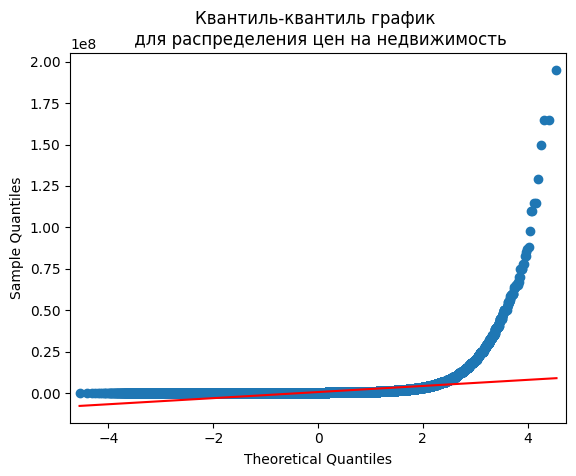

In [ ]:
import statsmodels.api as sm
from matplotlib import pyplot as plt

# интерпретируемые данные
data = df['target']

# задаём параметры квантиль-квантиль графика
sm.qqplot(data, line='s')
plt.title('Квантиль-квантиль график \n для распределения цен на недвижимость')

# отображаем квантиль-квантиль график
plt.show()

График больше похож на экспоненту чем на прямую. Данные не распределены нормально.

In [ ]:
fig = px.box(x=df['target'], points='outliers',
             labels=dict(x='Цена недвижимости, в $'),
             title="Плотность данных в зависимости от цены рыночных предложений")
fig.show()

In [ ]:
print(f"Количество домов в выборке c ценой от 10 млн.$: {df[df['target'] >= 10000000].count()[0]}")
mask = (df['target'] < 10000) & (df['status']!= 'rent')
print(f"Количество домов в выборке c ценой ниже 10 000 $: {df[mask].count()[0]}")

Количество домов в выборке c ценой от 10 млн.$: 1610
Количество домов в выборке c ценой ниже 10 000 $: 5633


In [ ]:
mask = (df['status'] == 'rent') | ((df['target'] >= 10000) &  (df['target'] < 10000000))
df = df[mask]
df.shape

(367124, 10)

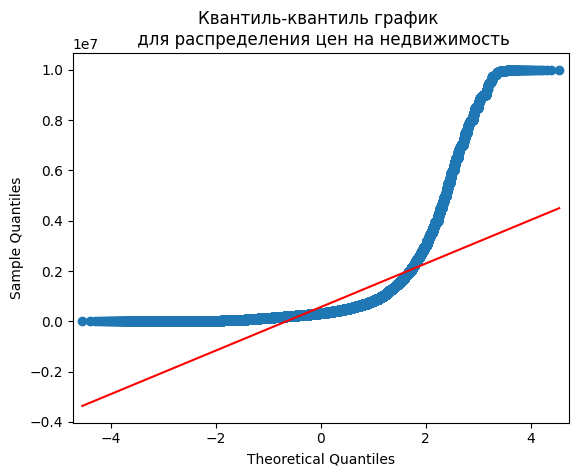

In [ ]:
# интерпретируемые данные
data = df['target']

# задаём параметры квантиль-квантиль графика
sm.qqplot(data, line='s')
plt.title('Квантиль-квантиль график \n для распределения цен на недвижимость')

# отображаем квантиль-квантиль график
plt.show()

После исключения около 7000 тысяч строк, данные стали ещё менее нормально распределены. Значит при построении гипотез, надо будет применять тесты расчитанные на произвольное распределение данных.

In [ ]:
df.head()

,status,sqft,privatePool,target,show,backup,contingent,yearBuilt,lotSize,unitPricePerSqFt
0,active,2900.0,0,418000,0,0,0,2019,124918.39,144.0
1,for sale,1947.0,0,310000,0,0,0,2019,5828.00,159.0
2,for sale,3000.0,1,2895000,0,0,0,1967,8626.00,965.0
3,for sale,6457.0,0,2395000,0,0,0,2006,8220.00,371.0
5,for sale,897.0,0,209000,0,0,0,1920,680.00,233.0


In [ ]:
fig = px.box(x=df['sqft'], points='outliers',
             labels=dict(x='Цена недвижимости, в $'),
             title="Плотность данных в зависимости от цены рыночных предложений")
fig.show()

#### Очистка данных в колонке 'sqft'.

In [ ]:
df['sqft'].describe()

count    3.671240e+05
mean     6.703848e+03
std      1.514700e+06
min      0.000000e+00
25%      1.310000e+03
50%      1.946000e+03
75%      3.054000e+03
max      7.959794e+08
Name: sqft, dtype: float64

In [ ]:
fig = px.box(x=df[df['sqft'] < 100000]['sqft'], points='outliers',
             labels=dict(x='Площадь объекта недвижимости, в кв. футах'),
             title="Площадь объекта недвижимости")
fig.show()

Большинство объектов имеют площадь менее 5700 квалратных футов.

In [ ]:
print(f"Количество домов в выборке c площадью объекта менее 300 квадратных футов: {df[df['sqft'] < 300].count()[0]}")
print(f"Количество домов в выборке c площадью объекта более 10000 квадратных футов: {df[df['sqft'] > 10000].count()[0]}")

Количество домов в выборке c площадью объекта менее 300 квадратных футов: 10577
Количество домов в выборке c площадью объекта более 10000 квадратных футов: 2684


In [ ]:
df = df[ (df['sqft'] >= 300) & (df['sqft'] <= 10000)]
df.shape

(353863, 10)

#### Очистка данных в колонке 'unitPricePerSqFt'.

In [ ]:
df['unitPricePerSqFt'].describe()

count    353863.000000
mean        235.228361
std         171.129701
min           0.000000
25%         127.000000
50%         196.000000
75%         259.700000
max        8768.000000
Name: unitPricePerSqFt, dtype: float64

In [ ]:
fig = px.box(x= df['unitPricePerSqFt'], points='outliers',
             labels=dict(x='Цена квадратного фута, в $'),
             title="Удельная цена объекта недвижимости")
fig.show()

In [ ]:
print(f"Удельная цена лота менее 10 долларов: {df[df['unitPricePerSqFt'] < 10].count()[0]}")
print(f"Удельная цена лота более 2000 долларов: {df[df['unitPricePerSqFt'] > 2000].count()[0]}")

Удельная цена лота менее 10 долларов: 6339
Удельная цена лота более 2000 долларов: 55


In [ ]:
df = df[(df['unitPricePerSqFt'] >= 10) & (df['unitPricePerSqFt'] <= 2000)]
df.shape

(347469, 10)

#### Очистка данных в колонке 'lotSize'.

In [ ]:
df['lotSize'].describe()

count    3.474690e+05
mean     1.072952e+05
std      6.511347e+06
min      2.500000e-01
25%      5.662000e+03
50%      1.000100e+04
75%      1.249184e+05
max      2.147484e+09
Name: lotSize, dtype: float64

In [ ]:
fig = px.box(x=df[df['lotSize'] < 1000000]['lotSize'], points='outliers',
             labels=dict(x='Площадь лота объекта недвижимости, в кв. футах'),
             title="Площадь лота объекта недвижимости c площадью менее 1 000 000")
fig.show()

In [ ]:
print(f"Количество домов в выборке c площадью лота менее квадратных футов: {df[df['lotSize'] < 300].count()[0]}")
print(f"Количество домов в выборке c площадью лота более 40000 квадратных футов: {df[df['lotSize'] > 1000000].count()[0]}")

Количество домов в выборке c площадью лота менее квадратных футов: 13345
Количество домов в выборке c площадью лота более 40000 квадратных футов: 1290


In [ ]:
df = df[(df['lotSize'] >= 300) & (df['lotSize'] < 1000000)]
df.shape

(332834, 10)

##### Проверка взаимозависимых признаков и связи признаков с целевой переменной:

<Axes: >

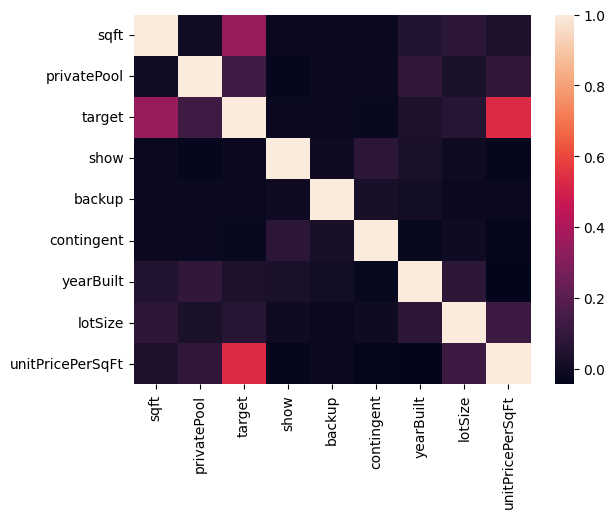

In [ ]:
import seaborn as sns

df_corr = df.select_dtypes(include=np.number)
sns.heatmap(df_corr.corr())

Видны два признака, которые заметно коррелируют с целевым признаком это unitPricePerSqFt и sqft. Сильно линейно зависимых между собой признаков нет.

### Проверка гипотез.

Будут проверены следующие гипотезы:
1. Влияние статуса на цену недвижимости.
2. Влияние наличия бассейна на цену недвижимости.
3. Влияние года постройки на цену недвижимости.

Так как целевой признак не распределён нормально будут использованы непараметрические статистические тесты.

Так как у меня много категорий статуса, то для тестирования различий цены в разных категориях будет применяться тест Краскела-Уолиcса.

In [ ]:
df['status'].unique()

array(['active', 'for sale', 'new', 'pending', 'auction', 'contract',
       'foreclosed', 'rent', 'price change', 'coming soon', 'contingency',
       'other'], dtype=object)

In [ ]:
from scipy import stats

H0 = 'Цена недвижимости не зависит от категории статуса'
H1 = 'Цена недвижимости зависит от категории статуса'

# group1 = pd.factorize(df['status'])[0]
groups = df.groupby(by='status')
group_values = [group['target'].values for name, group in groups]

# применяем тест Краскела-Уоллиса для сравнения групп
w, p = stats.kruskal(*group_values)

print("W-статистика:", w)
print("p-значение:", p)

if p < 0.05:
    print(H1)
else:
    print(H0)

W-статистика: 5839.926833536277
p-значение: 0.0
Цена недвижимости зависит от категории статуса


Так как различия в статусных группах по цене недвижимости статистически значимы можно провести порядковое кодирование статуса в зависимости от средней цены в группе.

In [ ]:
# группировка данные по 'status' и вычисление среднего значения для каждой группы
group_means = df.groupby('status')['target'].mean().sort_values()

# создание нового порядкового признака в заисимости от статуса
df['statusOrder'] = df['status'].map(group_means.rank())

# удаление использованного признака 'status'
df = df.drop(['status'], axis=1)

После проверки гипотезы, и применения номинального кодирования, все признаки представлены в числовом виде. Их надо отшкалировать, так как планируется применять, в том числе и модель линейной регресии. И после этого можно будет обучить модель и проверить её качество.

In [ ]:
df.head()

,sqft,privatePool,target,show,backup,contingent,yearBuilt,lotSize,unitPricePerSqFt,statusOrder
0,2900.0,0,418000,0,0,0,2019,124918.39,144.0,10.0
1,1947.0,0,310000,0,0,0,2019,5828.00,159.0,7.0
2,3000.0,1,2895000,0,0,0,1967,8626.00,965.0,7.0
3,6457.0,0,2395000,0,0,0,2006,8220.00,371.0,7.0
5,897.0,0,209000,0,0,0,1920,680.00,233.0,7.0


Проверю гипотезу о том, что наличие бассейна влияет на цену недвижимости. Так как независимый признак бинарный, а зависимый признак количествнный можно использовать знаковый ранговый тест Уилкоксона

In [ ]:
H0 = 'Цена недвижимости не зависит от наличия частного бассейна'
H1 = 'Цена недвижимости зависит от наличия частного бассейна'

# разделение данных на две группы по признаку наличия бассейна
group1 = df[df['privatePool'] == 1]['target']
group2 = df[df['privatePool'] == 0]['target']

# применяется тест Уилкоксона
w, p = stats.mannwhitneyu(group1, group2)

print("W-статистика:", w)
print("p-значение:", p)

if p < 0.05:
    print(H1)
else:
    print(H0)

W-статистика: 7613057735.5
p-значение: 0.0
Цена недвижимости зависит от наличия частного бассейна


Цена ожидаемо зависит от наличия частного бассейна. Поэтому это признак следует использвать в моделях машинного обучения.

Проверю теперь зависимость цены от года постройки объекта недвижимости. Для тестирования различий цены в разных категориях будет применяться тест Краскела-Уолиcса.

In [ ]:
from scipy import stats

H0 = 'Цена недвижимости не зависит от года постройки'
H1 = 'Цена недвижимости зависит от года постройки'

# group1 = pd.factorize(df['status'])[0]
groups = df.groupby(by='yearBuilt')
group_values = [group['target'].values for name, group in groups]

# применяем тест Краскела-Уоллиса для сравнения групп
w, p = stats.kruskal(*group_values)

print("W-статистика:", w)
print("p-значение:", p)

if p < 0.05:
    print(H1)
else:
    print(H0)

W-статистика: 24880.4466212825
p-значение: 0.0
Цена недвижимости зависит от года постройки


Если тест выполнен правильно, то можно предположить, что есть связь цены и года постройки здания. Как и в случае для статуса имеющиеся годы можно ранжировать и создать новый признак в зависимости от значений года. Хотя вероятно для точности ранжирования лучше когда в группе содержится много значений. Попробую применить ранжирование к году постройки дома.

In [ ]:
# группировка данные по 'status' и вычисление среднего значения для каждой группы
group_means = df.groupby('yearBuilt')['target'].mean().sort_values()

# создание нового порядкового признака в заисимости от статуса
df['yearFactor'] = df['yearBuilt'].map(group_means.rank())

In [ ]:
df.head(1)

,sqft,privatePool,target,show,backup,contingent,yearBuilt,lotSize,unitPricePerSqFt,statusOrder,yearFactor
0,2900.0,0,418000,0,0,0,2019,124918.39,144.0,10.0,112.0


Проверю коэффициент корреляции между колонками yearBuilt и decadeFactor и target и decadeFactor.

In [ ]:
print(f"Коэффициент корреляции между годом постройки и декадой: {df['yearBuilt'].corr(df['yearFactor'])}")

Коэффициент корреляции между годом постройки и декадой: 0.3205008463571478


In [ ]:
print(f"Коэффициент корреляции целевым признаком и декадой: {df['target'].corr(df['yearFactor'])}")

Коэффициент корреляции целевым признаком и декадой: 0.1512134190885422


Коэффициент оказался взаимовлияния с целевым признаком оказался совсем низким, и возможно не окажется полезен при обучении модели. Тем не менее, оставлю сформированный признак, до анализа результатов модели.

### Создание базового пайплайна.

Масштабирование признаков -- будет реализовано внутри паплайна. Общая идея такая, что сначала обрабатываются данные содержащие в том числе и выбросы, так как очистка была довольно мягкой и приводятся в вид более соответвующий нормальному распределению. Затем производится приведение к диапазону от 0 до 1 этих же данных. Это уравновесит разномасштабные коэффициенты признаков.

In [ ]:
from sklearn.preprocessing import QuantileTransformer, MinMaxScaler
from sklearn.compose import make_column_transformer
from sklearn.linear_model import Ridge
from sklearn.pipeline import Pipeline


columns_to_transform = ['sqft', 'yearBuilt', 'lotSize', 'unitPricePerSqFt', 'statusOrder', 'yearFactor']

# масштабирование признаков, приведение к диапазону от 0 до 1
ct = make_column_transformer(
    (QuantileTransformer(output_distribution='normal'), columns_to_transform),
    (MinMaxScaler(), columns_to_transform),)

steps = [('transfotmation', ct),
         ('ridge', Ridge(random_state=42))]

pipeline = Pipeline(steps)

### Разделение выборки на обучающую и тестовую.

In [ ]:
df.reset_index(drop=True, inplace=True)
df.head()

,sqft,privatePool,target,show,backup,contingent,yearBuilt,lotSize,unitPricePerSqFt,statusOrder,yearFactor
0,2900.0,0,418000,0,0,0,2019,124918.39,144.0,10.0,112.0
1,1947.0,0,310000,0,0,0,2019,5828.00,159.0,7.0,112.0
2,3000.0,1,2895000,0,0,0,1967,8626.00,965.0,7.0,34.0
3,6457.0,0,2395000,0,0,0,2006,8220.00,371.0,7.0,78.0
4,897.0,0,209000,0,0,0,1920,680.00,233.0,7.0,119.0


In [ ]:
from sklearn.model_selection import train_test_split

X = df.drop(['target'], axis=1)
y = df['target']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

### Обучение базовой модели линейной регрессии с L2 регуляризацией.  

In [ ]:
columns_lr = columns_to_transform

X_train_lr = X_train[columns_lr]
X_test_lr = X_test[columns_lr]

pipeline.fit(X_train_lr, y_train)

Pipeline(steps=[('transfotmation',
                 ColumnTransformer(transformers=[('quantiletransformer',
                                                  QuantileTransformer(output_distribution='normal'),
                                                  ['sqft', 'yearBuilt',
                                                   'lotSize',
                                                   'unitPricePerSqFt',
                                                   'statusOrder',
                                                   'yearFactor']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['sqft', 'yearBuilt',
                                                   'lotSize',
                                                   'unitPricePerSqFt',
                                                   'statusOrder',
                                                   'yearFactor'])])),
                ('ridge', Ridge(random_state=42))])

In [ ]:
from sklearn.metrics import r2_score, mean_absolute_percentage_error, mean_absolute_error
y_train_pred = pipeline.predict(X_train_lr)
y_test_pred = pipeline.predict(X_test_lr)

print(f'Качество по mape для тренировчной выборки: {round(mean_absolute_percentage_error(y_train, y_train_pred),4)}')
print(f'Качество по r2 score для тренировчной выборки: {round(r2_score(y_train, y_train_pred),4)}')
print(f'Качество по mae score для тренировчной выборки: {round(mean_absolute_error(y_train, y_train_pred),4)}\n\n')

print(f'Качество по mape для тестовой выборки: {round(mean_absolute_percentage_error(y_test, y_test_pred),4)}')
print(f'Качество по r2 score для тестовой выборки: {round(r2_score(y_test, y_test_pred),4)}')
print(f'Качество по mae score для тестовой выборки: {round(mean_absolute_error(y_test, y_test_pred),4)}')

Качество по mape для тренировчной выборки: 1.8531
Качество по r2 score для тренировчной выборки: 0.4386
Качество по mae score для тренировчной выборки: 226373.2045


Качество по mape для тестовой выборки: 1.8739
Качество по r2 score для тестовой выборки: 0.4444
Качество по mae score для тестовой выборки: 225123.649


Данная модель показала, оценку R2-score ниже 0.5, что считается плохим результатом. И ошибку в цене в 225743 тысячи долларов, что очень плохо.

Попробую выбрать наилучшие признаки для предсказания. И использовать только их.

In [ ]:
from sklearn.feature_selection import RFE

selector = RFE(estimator=Ridge(random_state=42), n_features_to_select=3, step=1)
selector = selector.fit(X, y)

print(selector.get_feature_names_out())
print()
print(f'Признаки рассматриваемые при отборе: {X.columns}')
print(f'Ранжирование важности признаков(меньше важнее): {selector.ranking_}')

['privatePool' 'backup' 'contingent']

Признаки рассматриваемые при отборе: Index(['sqft', 'privatePool', 'show', 'backup', 'contingent', 'yearBuilt',
       'lotSize', 'unitPricePerSqFt', 'statusOrder', 'yearFactor'],
      dtype='object')
Ранжирование важности признаков(меньше важнее): [7 1 3 1 1 6 8 4 2 5]


По всем признакам, алгоритм выбрал те, что не использовались в модели линейной регрессии. Добавлю в базовую модель 'status'. Другие наиболее важные признаки предполагалось использовать для обучения деревьев, так как их слишком мало относительно размеров выборки.

In [ ]:
columns_for_rfe = ['sqft', 'privatePool', 'yearBuilt',
       'lotSize', 'unitPricePerSqFt', 'statusOrder', 'yearFactor']

selector = selector.fit(X[columns_for_rfe], y)

print(selector.get_feature_names_out())
print()
print(f'Признаки рассматриваемые при отборе: {columns_for_rfe}')
print(f'Ранжирование важности признаков(меньше важнее): {selector.ranking_}')

['privatePool' 'unitPricePerSqFt' 'statusOrder']

Признаки рассматриваемые при отборе: ['sqft', 'privatePool', 'yearBuilt', 'lotSize', 'unitPricePerSqFt', 'statusOrder', 'yearFactor']
Ранжирование важности признаков(меньше важнее): [4 1 3 5 1 1 2]


Обучу базовую модель линейнной регрессии по трём выбранным признакам: ['privatePool' 'unitPricePerSqFt' 'statusOrder']

In [ ]:
columns_lr = ['privatePool', 'unitPricePerSqFt', 'statusOrder']

ct = make_column_transformer(
    (QuantileTransformer(output_distribution='normal'), ['unitPricePerSqFt']),
    (MinMaxScaler(), ['unitPricePerSqFt']),)

steps = [('transfotmation', ct),
         ('ridge', Ridge(random_state=42))]

pipeline = Pipeline(steps)

# другие признаки имеющие мало
X_train_lr = X_train[columns_lr]
X_test_lr = X_test[columns_lr]

pipeline.fit(X_train_lr, y_train)

Pipeline(steps=[('transfotmation',
                 ColumnTransformer(transformers=[('quantiletransformer',
                                                  QuantileTransformer(output_distribution='normal'),
                                                  ['unitPricePerSqFt']),
                                                 ('minmaxscaler',
                                                  MinMaxScaler(),
                                                  ['unitPricePerSqFt'])])),
                ('ridge', Ridge(random_state=42))])

In [ ]:
y_train_pred = pipeline.predict(X_train_lr)
y_test_pred = pipeline.predict(X_test_lr)

print(f'Качество по mape для тренировчной выборки: {round(mean_absolute_percentage_error(y_train, y_train_pred),4)}')
print(f'Качество по r2 score для тренировчной выборки: {round(r2_score(y_train, y_train_pred),4)}')
print(f'Качество по mae score для тренировчной выборки: {round(mean_absolute_error(y_train, y_train_pred),4)}\n\n')

print(f'Качество по mape для тестовой выборки: {round(mean_absolute_percentage_error(y_test, y_test_pred),4)}')
print(f'Качество по r2 score для тестовой выборки: {round(r2_score(y_test, y_test_pred),4)}')
print(f'Качество по mae score для тестовой выборки: {round(mean_absolute_error(y_test, y_test_pred),4)}')

Качество по mape для тренировчной выборки: 1.5288
Качество по r2 score для тренировчной выборки: 0.2768
Качество по mae score для тренировчной выборки: 274445.9546


Качество по mape для тестовой выборки: 1.5021
Качество по r2 score для тестовой выборки: 0.2825
Качество по mae score для тестовой выборки: 273076.8245


По выбранным признакам качество стало только хуже. Попробую использовать стеккинг для улучшения качества модели.


In [ ]:
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor

# Создаем список кортежей вида: (наименование модели, модель)
estimators = [
    ('dt', DecisionTreeRegressor(random_state=42)),
    ('knn', KNeighborsRegressor())
]

# Создаем объект класса стекинг
stacking_model = StackingRegressor(
    estimators=estimators,
    final_estimator=RandomForestRegressor(n_estimators=100,
                                 max_depth=10,
                                 random_state=42))

stacking_model.fit(X_train, y_train)

StackingRegressor(estimators=[('dt', DecisionTreeRegressor(random_state=42)),
                              ('knn', KNeighborsRegressor())],
                  final_estimator=RandomForestRegressor(max_depth=10,
                                                        random_state=42))

In [ ]:
y_train_pred = stacking_model.predict(X_train)
y_test_pred = stacking_model.predict(X_test)

print(f'Качество по mape для тренировчной выборки: {round(mean_absolute_percentage_error(y_train, y_train_pred),4)}')
print(f'Качество по r2 score для тренировчной выборки: {round(r2_score(y_train, y_train_pred),4)}')
print(f'Качество по mae score для тренировчной выборки: {round(mean_absolute_error(y_train, y_train_pred),4)}\n\n')

print(f'Качество по mape для тестовой выборки: {round(mean_absolute_percentage_error(y_test, y_test_pred),4)}')
print(f'Качество по r2 score для тестовой выборки: {round(r2_score(y_test, y_test_pred),4)}')
print(f'Качество по mae score для тестовой выборки: {round(mean_absolute_error(y_test, y_test_pred),4)}')

Качество по mape для тренировчной выборки: 0.4714
Качество по r2 score для тренировчной выборки: 0.7499
Качество по mae score для тренировчной выборки: 61532.7109


Качество по mape для тестовой выборки: 0.5451
Качество по r2 score для тестовой выборки: 0.6901
Качество по mae score для тестовой выборки: 78349.0923


Видно, что качество модели очень сильно улучшилось. Если смотерть на процентное значение ошибка составила всего полпроцента. Коэффициент детерминации, так же говорит о хорошей предсказательной способности модели. Большая величина ошибки абсолютной вызвана вероятно довольно сильным влиянием дорогой недвижимости в выборке.
Основной вывод, который можно слелать на данный момент, что взята меньшая часть признаков, а мощные модели МО тем не менее позволяют достаточно, точно предсказть целевую переменную.
Для дальнейшего улучшения качества, предсказания требуется сильнее очистить выбросы. И оптимизировать параметры используемых моделей.
Но в тоже время есть подозрение, что используемых признаков для совсем хороших предсказаний всё же мало.

### Развёртывание модели.

In [ ]:
steps = [('model', stacking_model)]

pipeline = Pipeline(steps)

Сохраняю лучшую модель:

In [ ]:
!pip install joblib
import joblib
joblib.dump(pipeline, 'diplom_pipeline.pkl')

['diplom_pipeline.pkl']